In [1]:
# making A Generative Adverserial Network(GAN's) for the first time to generate dog images

from torchvision.datasets import ImageFolder,FashionMNIST
from torch.utils.data import DataLoader
import torch.nn as nn
import torch
from torchvision.utils import make_grid
from torchvision import transforms
import os
import numpy as np

from tqdm import tqdm 
import matplotlib.pyplot as plt
import torchvision.utils as vutils

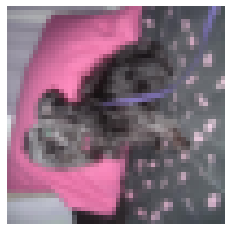

In [17]:
## My folder structure was 
'''
petimages//Cat -- Dog ,
MUST READ --

since,
I wanted only dogs as my Entry in The Gan to generate imgs of dogs🐶🐶🐶

Image folder gives an error if you directly reads a folder with images 

instead it demands a folder of images 

so i changed my structure to --- 
petsimages// Cats -- img
I moved the Dog folder to img 
'''
folder = ImageFolder(root='../starters/PetImages/img',transform=transforms.Compose([
    transforms.Resize((50,50)),
    transforms.ToTensor()]))

train_loader = DataLoader(folder,batch_size=32)
images,labels = next(iter(train_loader))

plt.imshow(images[0].squeeze().permute(2,1,0))
plt.axis('off')
plt.show()

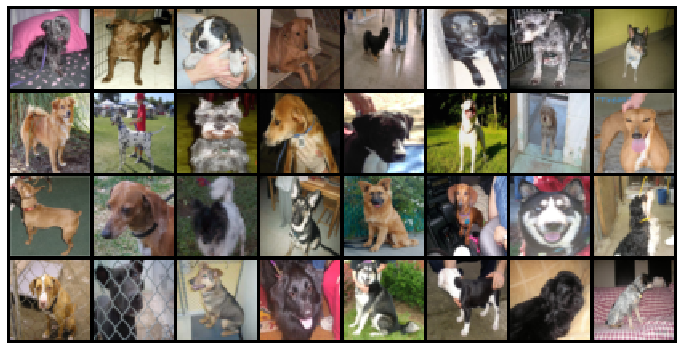

In [18]:
def show(img):
    plt.figure(figsize=(12,10))
    npimg = img.numpy()
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')

grid = make_grid(images, nrow=8)
show(grid)

Making a Generator which takes in a noise vector and makes it into a image vector 

which gets feeded to our Discriminator class 

In [10]:
class generator(nn.Module):
    def __init__(self,noise=64,imagedim=2500):
        super(generator,self).__init__()
        self.genlayers = nn.Sequential(
            nn.Linear(noise,256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.3),
            nn.Linear(256,558),
            nn.LeakyReLU(0.3),
            nn.Linear(558,1000),
            nn.BatchNorm1d(1000),
            nn.LeakyReLU(0.3),
            nn.Linear(1000,2500)
                    )
    def forward(self,z):
        return self.genlayers(z)
         

class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=2500):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Linear(im_dim,1000),
            nn.LeakyReLU(0.3),
            nn.Linear(1000,556),
            nn.BatchNorm1d(556),
            nn.LeakyReLU(0.3),
            nn.Linear(556,264),
            nn.BatchNorm1d(264),
            nn.LeakyReLU(0.3),
            nn.Linear(264,1),
            nn.Sigmoid()
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc


  0%|                                                             | 0/2 [00:00<?, ?it/s]
0it [00:00, ?it/s]

3233274


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][0/388] Loss_D: 1.4277; Loss_G: 0.9017


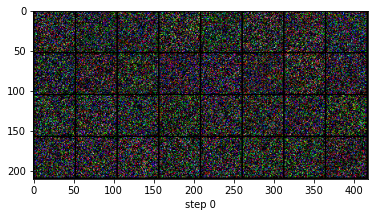


1it [00:01,  1.30s/it]
2it [00:01,  1.25it/s]
3it [00:02,  1.46it/s]
4it [00:02,  1.65it/s]
5it [00:03,  1.68it/s]
6it [00:03,  1.85it/s]
7it [00:04,  1.96it/s]
8it [00:04,  2.04it/s]
9it [00:05,  1.99it/s]
10it [00:05,  2.05it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][10/388] Loss_D: 1.5271; Loss_G: 0.3740


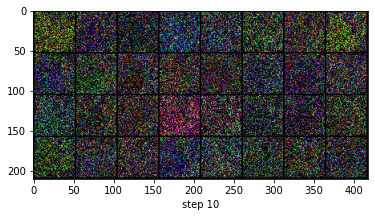


11it [00:07,  1.32it/s]
12it [00:07,  1.47it/s]
13it [00:07,  1.65it/s]
14it [00:08,  1.80it/s]
15it [00:08,  1.92it/s]
16it [00:09,  2.02it/s]
17it [00:09,  2.08it/s]
18it [00:10,  2.15it/s]
19it [00:10,  2.21it/s]
20it [00:11,  2.25it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][20/388] Loss_D: 1.5227; Loss_G: 0.4001


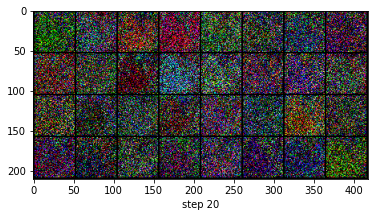


21it [00:12,  1.40it/s]
22it [00:12,  1.57it/s]
23it [00:13,  1.74it/s]
24it [00:13,  1.88it/s]
25it [00:14,  1.98it/s]
26it [00:14,  2.06it/s]
27it [00:15,  2.10it/s]
28it [00:15,  2.15it/s]
29it [00:15,  2.18it/s]
30it [00:16,  2.21it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][30/388] Loss_D: 1.4688; Loss_G: 0.4416


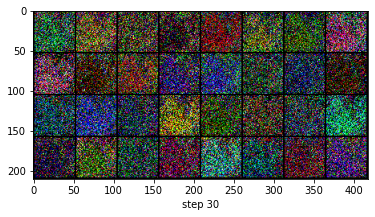


31it [00:17,  1.41it/s]
32it [00:18,  1.60it/s]
33it [00:18,  1.75it/s]
34it [00:18,  1.87it/s]
35it [00:19,  1.98it/s]
36it [00:19,  2.02it/s]
37it [00:20,  2.08it/s]
38it [00:20,  2.12it/s]
39it [00:21,  2.17it/s]
40it [00:21,  2.19it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][40/388] Loss_D: 1.5045; Loss_G: 0.4125


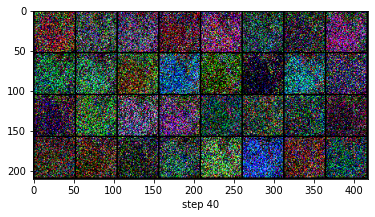


41it [00:22,  1.42it/s]
42it [00:23,  1.60it/s]
43it [00:23,  1.76it/s]
44it [00:24,  1.91it/s]
45it [00:24,  2.00it/s]
46it [00:25,  2.10it/s]
47it [00:25,  2.13it/s]
48it [00:26,  2.17it/s]
49it [00:26,  2.22it/s]
50it [00:26,  2.15it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][50/388] Loss_D: 1.5297; Loss_G: 0.3839


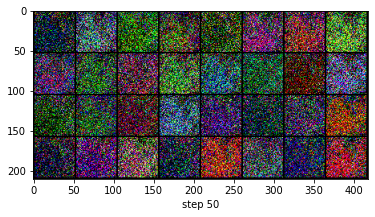


51it [00:28,  1.42it/s]
52it [00:28,  1.62it/s]
53it [00:29,  1.76it/s]
54it [00:29,  1.90it/s]
55it [00:29,  2.00it/s]
56it [00:30,  2.09it/s]
57it [00:30,  2.11it/s]
58it [00:31,  2.17it/s]
59it [00:31,  2.19it/s]
60it [00:32,  2.21it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][60/388] Loss_D: 1.5111; Loss_G: 0.4114


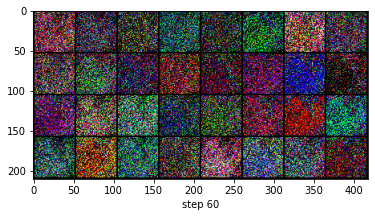


61it [00:33,  1.43it/s]
62it [00:33,  1.61it/s]
63it [00:34,  1.71it/s]
64it [00:34,  1.84it/s]
65it [00:35,  1.93it/s]
66it [00:35,  2.02it/s]
67it [00:36,  2.10it/s]
68it [00:36,  2.17it/s]
69it [00:37,  2.20it/s]
70it [00:37,  2.21it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][70/388] Loss_D: 1.4865; Loss_G: 0.4318


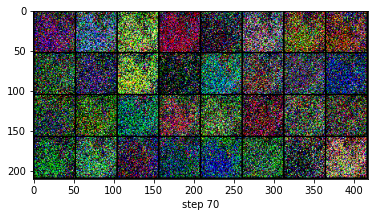


71it [00:38,  1.42it/s]
72it [00:39,  1.61it/s]
73it [00:39,  1.75it/s]
74it [00:40,  1.87it/s]
75it [00:40,  1.93it/s]
76it [00:41,  2.01it/s]
77it [00:41,  2.09it/s]
78it [00:41,  2.12it/s]
79it [00:42,  2.16it/s]
80it [00:42,  2.18it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][80/388] Loss_D: 1.5084; Loss_G: 0.3999


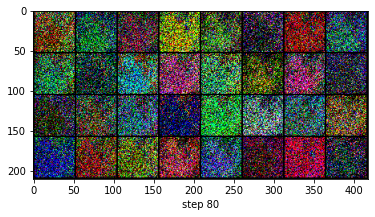


81it [00:44,  1.43it/s]
82it [00:44,  1.62it/s]
83it [00:44,  1.76it/s]
84it [00:45,  1.89it/s]
85it [00:45,  2.01it/s]
86it [00:46,  2.08it/s]
87it [00:46,  2.14it/s]
88it [00:47,  2.19it/s]
89it [00:47,  2.25it/s]
90it [00:47,  2.24it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][90/388] Loss_D: 1.5259; Loss_G: 0.3896


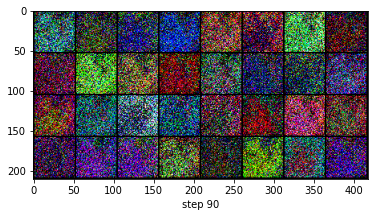


91it [00:49,  1.41it/s]
92it [00:49,  1.60it/s]
93it [00:50,  1.76it/s]
94it [00:50,  1.88it/s]
95it [00:51,  1.97it/s]
96it [00:51,  2.05it/s]
97it [00:51,  2.06it/s]
98it [00:52,  2.06it/s]
99it [00:52,  2.06it/s]
100it [00:53,  2.07it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][100/388] Loss_D: 1.5005; Loss_G: 0.4135


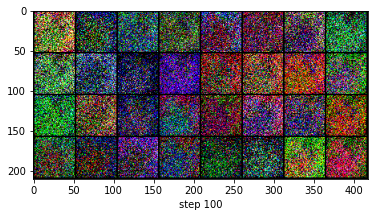


101it [00:54,  1.38it/s]
102it [00:55,  1.53it/s]
103it [00:55,  1.66it/s]
104it [00:56,  1.78it/s]
105it [00:56,  1.87it/s]
106it [00:57,  1.87it/s]
107it [00:57,  1.96it/s]
108it [00:58,  2.00it/s]
109it [00:58,  2.06it/s]
110it [00:58,  2.09it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][110/388] Loss_D: 1.4867; Loss_G: 0.4222


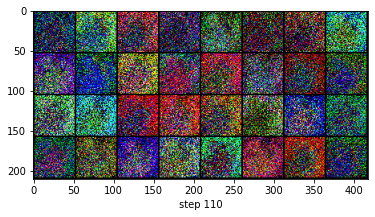


111it [01:00,  1.27it/s]
112it [01:00,  1.44it/s]
113it [01:01,  1.51it/s]
114it [01:02,  1.65it/s]
115it [01:02,  1.75it/s]
116it [01:03,  1.84it/s]
117it [01:03,  1.91it/s]
118it [01:03,  1.97it/s]
119it [01:04,  2.00it/s]
120it [01:04,  2.02it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][120/388] Loss_D: 1.4861; Loss_G: 0.4147


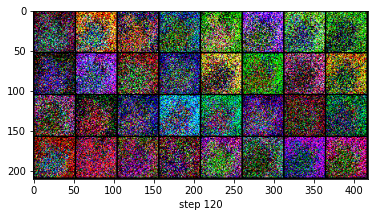


121it [01:06,  1.30it/s]
122it [01:06,  1.44it/s]
123it [01:07,  1.57it/s]
124it [01:07,  1.71it/s]
125it [01:08,  1.72it/s]
126it [01:08,  1.78it/s]
127it [01:09,  1.84it/s]
128it [01:09,  1.81it/s]
129it [01:10,  1.79it/s]
130it [01:11,  1.87it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][130/388] Loss_D: 1.5174; Loss_G: 0.3948


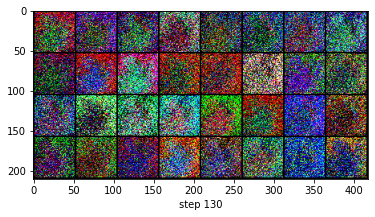


131it [01:12,  1.25it/s]
132it [01:12,  1.41it/s]
133it [01:13,  1.59it/s]
134it [01:13,  1.71it/s]
135it [01:14,  1.80it/s]
136it [01:14,  1.86it/s]
137it [01:15,  1.92it/s]
138it [01:15,  1.97it/s]
139it [01:16,  2.03it/s]
140it [01:16,  2.06it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][140/388] Loss_D: 1.5052; Loss_G: 0.4090


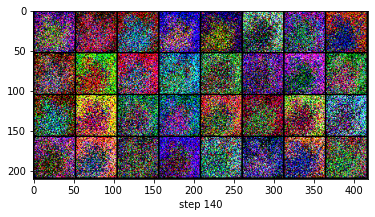


141it [01:18,  1.38it/s]
142it [01:18,  1.50it/s]
143it [01:19,  1.63it/s]
144it [01:19,  1.77it/s]
145it [01:19,  1.84it/s]
146it [01:20,  1.91it/s]
147it [01:20,  1.98it/s]
148it [01:21,  2.01it/s]
149it [01:21,  2.04it/s]
150it [01:22,  2.08it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][150/388] Loss_D: 1.4806; Loss_G: 0.4217


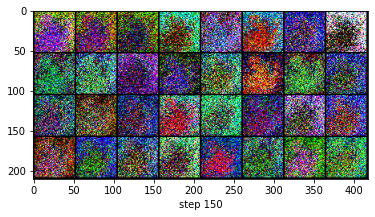


151it [01:23,  1.35it/s]
152it [01:24,  1.50it/s]
153it [01:24,  1.64it/s]
154it [01:25,  1.76it/s]
155it [01:25,  1.86it/s]
156it [01:26,  1.92it/s]
157it [01:26,  1.98it/s]
158it [01:27,  2.00it/s]
159it [01:27,  2.02it/s]
160it [01:27,  2.05it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][160/388] Loss_D: 1.5204; Loss_G: 0.4027


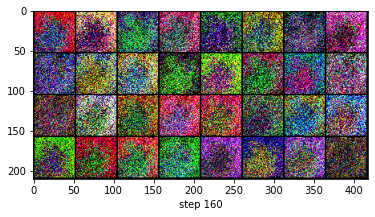


161it [01:29,  1.37it/s]
162it [01:29,  1.55it/s]
163it [01:30,  1.68it/s]
164it [01:30,  1.79it/s]
165it [01:31,  1.87it/s]
166it [01:31,  1.94it/s]
167it [01:32,  1.98it/s]
168it [01:32,  2.00it/s]
169it [01:33,  2.02it/s]
170it [01:33,  2.05it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][170/388] Loss_D: 1.4974; Loss_G: 0.4104


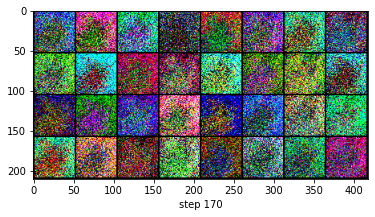


171it [01:34,  1.36it/s]
172it [01:35,  1.52it/s]
173it [01:35,  1.67it/s]
174it [01:36,  1.79it/s]
175it [01:36,  1.87it/s]
176it [01:37,  1.93it/s]
177it [01:37,  1.97it/s]
178it [01:38,  2.01it/s]
179it [01:38,  2.05it/s]
180it [01:39,  2.04it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][180/388] Loss_D: 1.5052; Loss_G: 0.4079


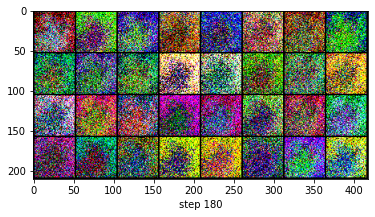


181it [01:40,  1.27it/s]
182it [01:41,  1.44it/s]
183it [01:41,  1.58it/s]
184it [01:42,  1.70it/s]
185it [01:42,  1.76it/s]
186it [01:43,  1.84it/s]
187it [01:43,  1.90it/s]
188it [01:44,  1.92it/s]
189it [01:44,  1.96it/s]
190it [01:45,  2.02it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][190/388] Loss_D: 1.5174; Loss_G: 0.4034


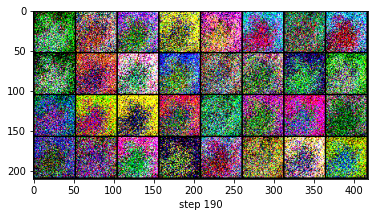


191it [01:46,  1.36it/s]
192it [01:46,  1.49it/s]
193it [01:47,  1.61it/s]
194it [01:47,  1.73it/s]
195it [01:48,  1.82it/s]
196it [01:48,  1.87it/s]
197it [01:49,  1.90it/s]
198it [01:49,  1.94it/s]
199it [01:50,  2.01it/s]
200it [01:50,  2.06it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][200/388] Loss_D: 1.4962; Loss_G: 0.4143


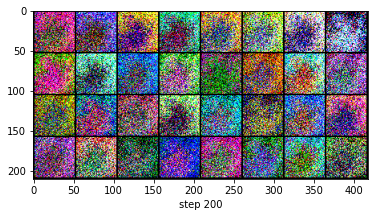


201it [01:51,  1.41it/s]
202it [01:52,  1.55it/s]
203it [01:52,  1.67it/s]
204it [01:53,  1.78it/s]
205it [01:53,  1.75it/s]
206it [01:54,  1.76it/s]
207it [01:55,  1.86it/s]
208it [01:55,  1.93it/s]
209it [01:55,  1.96it/s]
210it [01:56,  1.97it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][210/388] Loss_D: 1.5171; Loss_G: 0.4044


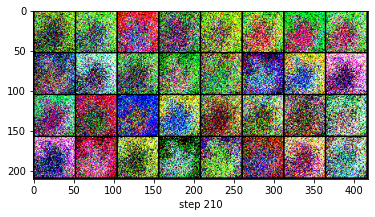


211it [01:57,  1.29it/s]
212it [01:58,  1.45it/s]
213it [01:58,  1.60it/s]
214it [01:59,  1.75it/s]
215it [01:59,  1.87it/s]
216it [02:00,  1.93it/s]
217it [02:00,  1.98it/s]
218it [02:01,  2.00it/s]
219it [02:01,  2.02it/s]
220it [02:02,  2.05it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][220/388] Loss_D: 1.5091; Loss_G: 0.4037


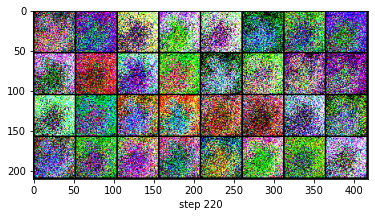


221it [02:03,  1.32it/s]
222it [02:04,  1.48it/s]
223it [02:04,  1.63it/s]
224it [02:04,  1.73it/s]
225it [02:05,  1.82it/s]
226it [02:05,  1.90it/s]
227it [02:06,  1.99it/s]
228it [02:06,  2.02it/s]
229it [02:07,  2.07it/s]
230it [02:07,  2.06it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][230/388] Loss_D: 1.5200; Loss_G: 0.3998


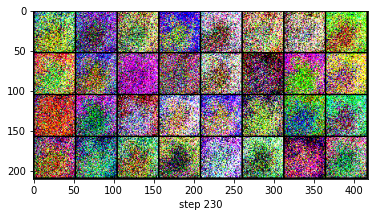


231it [02:09,  1.38it/s]
232it [02:09,  1.52it/s]
233it [02:10,  1.66it/s]
234it [02:10,  1.78it/s]
235it [02:10,  1.88it/s]
236it [02:11,  1.93it/s]
237it [02:11,  1.99it/s]
238it [02:12,  2.06it/s]
239it [02:12,  2.07it/s]
240it [02:13,  2.10it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][240/388] Loss_D: 1.4869; Loss_G: 0.4154


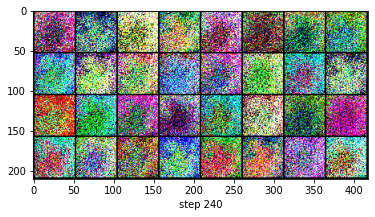


241it [02:14,  1.37it/s]
242it [02:15,  1.53it/s]
243it [02:15,  1.67it/s]
244it [02:16,  1.80it/s]
245it [02:16,  1.89it/s]
246it [02:16,  1.94it/s]
247it [02:17,  1.98it/s]
248it [02:17,  2.01it/s]
249it [02:18,  2.06it/s]
250it [02:18,  2.07it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][250/388] Loss_D: 1.5118; Loss_G: 0.4099


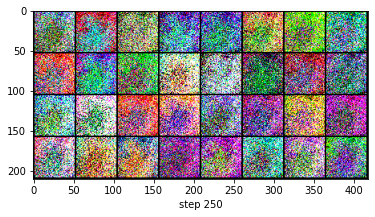


251it [02:20,  1.37it/s]
252it [02:20,  1.54it/s]
253it [02:21,  1.67it/s]
254it [02:21,  1.77it/s]
255it [02:22,  1.85it/s]
256it [02:22,  1.94it/s]
257it [02:23,  1.96it/s]
258it [02:23,  2.00it/s]
259it [02:24,  2.01it/s]
260it [02:24,  2.08it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][260/388] Loss_D: 1.5202; Loss_G: 0.3942


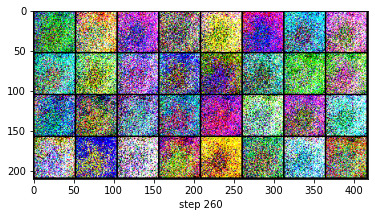


261it [02:25,  1.37it/s]
262it [02:26,  1.53it/s]
263it [02:26,  1.65it/s]
264it [02:27,  1.76it/s]
265it [02:27,  1.80it/s]
266it [02:28,  1.86it/s]
267it [02:28,  1.92it/s]
268it [02:29,  1.93it/s]
269it [02:29,  1.97it/s]
270it [02:30,  2.02it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][270/388] Loss_D: 1.5142; Loss_G: 0.4011


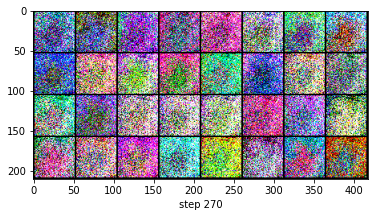


271it [02:31,  1.34it/s]
272it [02:32,  1.48it/s]
273it [02:32,  1.71it/s]
274it [02:32,  1.79it/s]
275it [02:33,  1.86it/s]
276it [02:34,  1.80it/s]
277it [02:34,  1.77it/s]
278it [02:35,  1.70it/s]
279it [02:35,  1.79it/s]
280it [02:36,  1.85it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][280/388] Loss_D: 1.4921; Loss_G: 0.4236


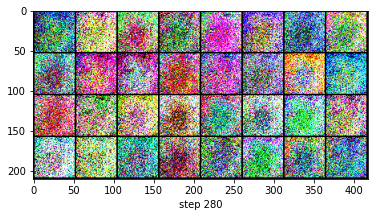


281it [02:37,  1.28it/s]
282it [02:38,  1.44it/s]
283it [02:38,  1.58it/s]
284it [02:39,  1.68it/s]
285it [02:39,  1.71it/s]
286it [02:40,  1.71it/s]
287it [02:40,  1.76it/s]
288it [02:41,  1.86it/s]
289it [02:41,  1.94it/s]
290it [02:42,  1.95it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][290/388] Loss_D: 1.5005; Loss_G: 0.4136


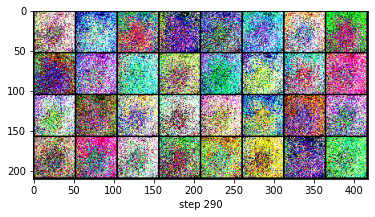


291it [02:43,  1.32it/s]
292it [02:43,  1.48it/s]
293it [02:44,  1.62it/s]
294it [02:44,  1.69it/s]
295it [02:45,  1.80it/s]
296it [02:45,  1.86it/s]
297it [02:46,  1.90it/s]
298it [02:46,  1.90it/s]
299it [02:47,  1.95it/s]
300it [02:47,  2.02it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][300/388] Loss_D: 1.5237; Loss_G: 0.3917


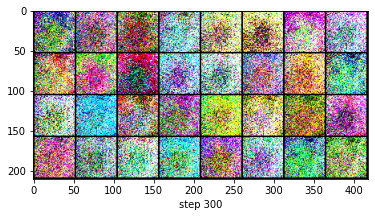


301it [02:49,  1.33it/s]
302it [02:49,  1.49it/s]
303it [02:50,  1.64it/s]
304it [02:50,  1.76it/s]
305it [02:51,  1.87it/s]
306it [02:51,  1.96it/s]
307it [02:52,  1.99it/s]
308it [02:52,  2.03it/s]
309it [02:53,  2.00it/s]
310it [02:53,  2.04it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][310/388] Loss_D: 1.5286; Loss_G: 0.4031


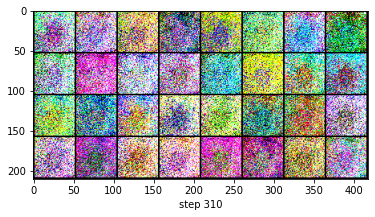


311it [02:54,  1.36it/s]
312it [02:55,  1.53it/s]
313it [02:55,  1.67it/s]
314it [02:56,  1.77it/s]
315it [02:56,  1.86it/s]
316it [02:57,  1.91it/s]
317it [02:57,  1.97it/s]
318it [02:58,  2.03it/s]
319it [02:58,  2.05it/s]
320it [02:59,  2.07it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][320/388] Loss_D: 1.5204; Loss_G: 0.4096


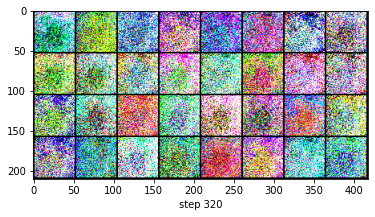


321it [03:00,  1.32it/s]
322it [03:00,  1.50it/s]
323it [03:01,  1.64it/s]
324it [03:01,  1.76it/s]
325it [03:02,  1.87it/s]
326it [03:02,  1.95it/s]
327it [03:03,  2.00it/s]
328it [03:03,  2.03it/s]
329it [03:04,  2.05it/s]
330it [03:04,  2.07it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][330/388] Loss_D: 1.5181; Loss_G: 0.4029


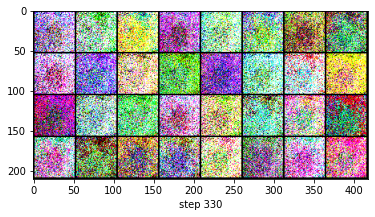


331it [03:05,  1.39it/s]
332it [03:06,  1.54it/s]
333it [03:06,  1.69it/s]
334it [03:07,  1.80it/s]
335it [03:07,  1.89it/s]
336it [03:08,  1.95it/s]
337it [03:08,  1.98it/s]
338it [03:09,  2.02it/s]
339it [03:09,  2.06it/s]
340it [03:10,  2.06it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][340/388] Loss_D: 1.5000; Loss_G: 0.4077


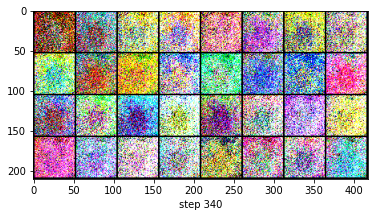


341it [03:11,  1.36it/s]
342it [03:12,  1.52it/s]
343it [03:12,  1.64it/s]
344it [03:12,  1.77it/s]
345it [03:13,  1.85it/s]
346it [03:13,  1.91it/s]
347it [03:14,  1.96it/s]
348it [03:14,  1.98it/s]
349it [03:15,  2.00it/s]
350it [03:15,  2.01it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][350/388] Loss_D: 1.5011; Loss_G: 0.4098


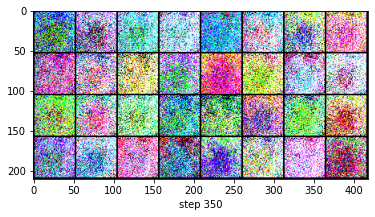


351it [03:17,  1.37it/s]
352it [03:17,  1.54it/s]
353it [03:18,  1.67it/s]
354it [03:18,  1.78it/s]
355it [03:19,  1.90it/s]
356it [03:19,  1.97it/s]
357it [03:20,  1.98it/s]
358it [03:20,  1.98it/s]
359it [03:21,  1.97it/s]
360it [03:21,  1.97it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][360/388] Loss_D: 1.4534; Loss_G: 0.4287


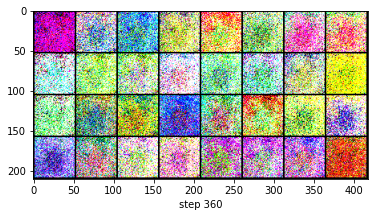


361it [03:22,  1.35it/s]
362it [03:23,  1.50it/s]
363it [03:23,  1.65it/s]
364it [03:24,  1.78it/s]
365it [03:24,  1.87it/s]
366it [03:25,  1.95it/s]
367it [03:25,  1.96it/s]
368it [03:26,  1.98it/s]
369it [03:26,  2.02it/s]
370it [03:27,  2.02it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][370/388] Loss_D: 1.5131; Loss_G: 0.4061


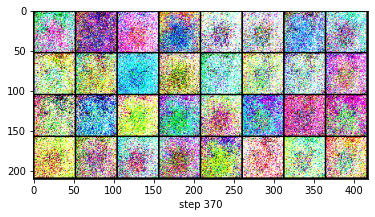


371it [03:28,  1.37it/s]
372it [03:28,  1.51it/s]
373it [03:29,  1.67it/s]
374it [03:29,  1.78it/s]
375it [03:30,  1.85it/s]
376it [03:30,  1.91it/s]
377it [03:31,  1.97it/s]
378it [03:31,  1.99it/s]
379it [03:32,  2.00it/s]
380it [03:32,  2.01it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/2][380/388] Loss_D: 1.4661; Loss_G: 0.4227


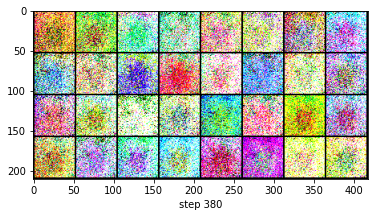


381it [03:34,  1.32it/s]
382it [03:34,  1.46it/s]
383it [03:35,  1.60it/s]
384it [03:35,  1.72it/s]
385it [03:36,  1.81it/s]
386it [03:36,  1.79it/s]
387it [03:37,  1.86it/s]
388it [03:37,  1.79it/s]
 50%|██████████████████████████                          | 1/2 [03:37<03:37, 217.32s/it]
0it [00:00, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][0/388] Loss_D: 1.5070; Loss_G: 0.4110


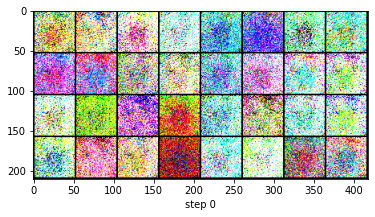


1it [00:01,  1.29s/it]
2it [00:01,  1.28it/s]
3it [00:02,  1.56it/s]
4it [00:02,  1.79it/s]
5it [00:03,  1.98it/s]
6it [00:03,  2.10it/s]
7it [00:03,  2.21it/s]
8it [00:04,  2.21it/s]
9it [00:04,  2.24it/s]
10it [00:05,  2.26it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][10/388] Loss_D: 1.5315; Loss_G: 0.3913


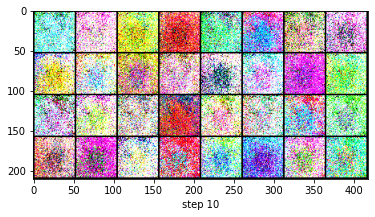


11it [00:06,  1.40it/s]
12it [00:06,  1.58it/s]
13it [00:07,  1.73it/s]
14it [00:07,  1.84it/s]
15it [00:08,  1.98it/s]
16it [00:08,  2.09it/s]
17it [00:09,  2.14it/s]
18it [00:09,  2.18it/s]
19it [00:10,  2.19it/s]
20it [00:10,  2.22it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][20/388] Loss_D: 1.5061; Loss_G: 0.4029


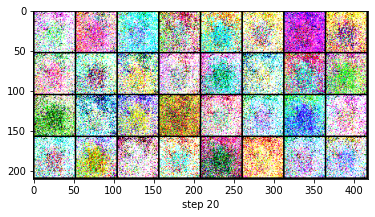


21it [00:11,  1.46it/s]
22it [00:12,  1.45it/s]
23it [00:12,  1.57it/s]
24it [00:13,  1.54it/s]
25it [00:14,  1.64it/s]
26it [00:14,  1.76it/s]
27it [00:15,  1.91it/s]
28it [00:15,  1.84it/s]
29it [00:16,  1.89it/s]
30it [00:16,  2.02it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][30/388] Loss_D: 1.5145; Loss_G: 0.4063


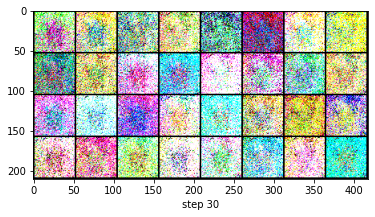


31it [00:17,  1.26it/s]
32it [00:18,  1.45it/s]
33it [00:18,  1.72it/s]
34it [00:19,  1.95it/s]
35it [00:19,  2.08it/s]
36it [00:19,  2.21it/s]
37it [00:20,  2.23it/s]
38it [00:20,  2.42it/s]
39it [00:21,  2.40it/s]
40it [00:21,  2.48it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][40/388] Loss_D: 1.4958; Loss_G: 0.4108


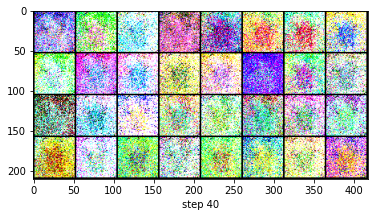


41it [00:22,  1.52it/s]
42it [00:23,  1.60it/s]
43it [00:23,  1.87it/s]
44it [00:23,  2.16it/s]
45it [00:24,  2.20it/s]
46it [00:24,  2.25it/s]
47it [00:25,  2.32it/s]
48it [00:25,  2.46it/s]
49it [00:25,  2.40it/s]
50it [00:26,  2.30it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][50/388] Loss_D: 1.4817; Loss_G: 0.4119


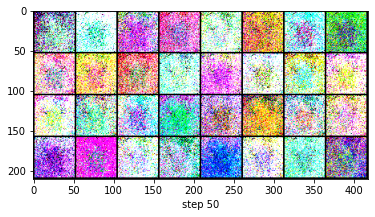


51it [00:27,  1.44it/s]
52it [00:28,  1.62it/s]
53it [00:28,  1.77it/s]
54it [00:29,  1.90it/s]
55it [00:29,  1.98it/s]
56it [00:29,  2.07it/s]
57it [00:30,  2.07it/s]
58it [00:30,  2.19it/s]
59it [00:31,  2.21it/s]
60it [00:31,  2.41it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][60/388] Loss_D: 1.5122; Loss_G: 0.4042


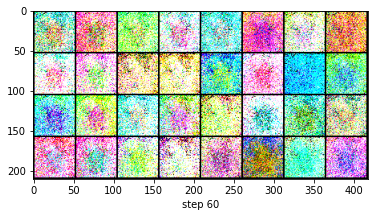


61it [00:32,  1.55it/s]
62it [00:33,  1.80it/s]
63it [00:33,  1.99it/s]
64it [00:33,  2.16it/s]
65it [00:34,  2.27it/s]
66it [00:34,  2.28it/s]
67it [00:35,  2.22it/s]
68it [00:35,  2.28it/s]
69it [00:35,  2.32it/s]
70it [00:36,  2.38it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][70/388] Loss_D: 1.5156; Loss_G: 0.3967


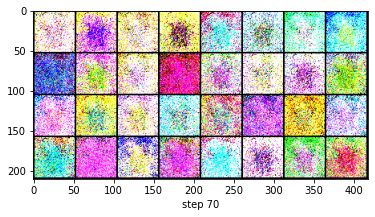


71it [00:37,  1.45it/s]
72it [00:38,  1.59it/s]
73it [00:38,  1.75it/s]
74it [00:39,  1.89it/s]
75it [00:39,  1.98it/s]
76it [00:39,  2.10it/s]
77it [00:40,  2.24it/s]
78it [00:40,  2.24it/s]
79it [00:41,  2.28it/s]
80it [00:41,  2.28it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][80/388] Loss_D: 1.4866; Loss_G: 0.4117


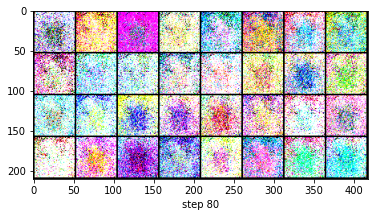


81it [00:43,  1.36it/s]
82it [00:43,  1.52it/s]
83it [00:43,  1.71it/s]
84it [00:44,  1.88it/s]
85it [00:44,  1.99it/s]
86it [00:45,  2.10it/s]
87it [00:45,  2.16it/s]
88it [00:46,  2.19it/s]
89it [00:46,  2.22it/s]
90it [00:46,  2.22it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][90/388] Loss_D: 1.5038; Loss_G: 0.4078


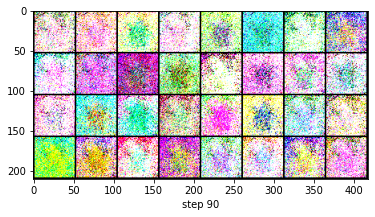


91it [00:48,  1.38it/s]
92it [00:48,  1.56it/s]
93it [00:49,  1.73it/s]
94it [00:49,  1.84it/s]
95it [00:50,  1.95it/s]
96it [00:50,  2.03it/s]
97it [00:51,  2.00it/s]
98it [00:51,  2.07it/s]
99it [00:51,  2.06it/s]
100it [00:52,  2.09it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][100/388] Loss_D: 1.4958; Loss_G: 0.4071


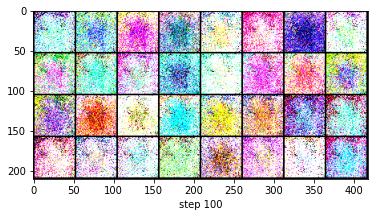


101it [00:53,  1.42it/s]
102it [00:54,  1.60it/s]
103it [00:54,  1.71it/s]
104it [00:54,  1.94it/s]
105it [00:55,  2.06it/s]
106it [00:55,  2.11it/s]
107it [00:56,  2.19it/s]
108it [00:56,  2.24it/s]
109it [00:57,  2.26it/s]
110it [00:57,  2.25it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][110/388] Loss_D: 1.5175; Loss_G: 0.4033


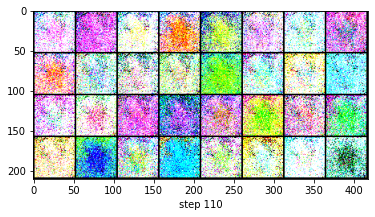


111it [00:58,  1.47it/s]
112it [00:59,  1.71it/s]
113it [00:59,  1.96it/s]
114it [00:59,  2.03it/s]
115it [01:00,  2.16it/s]
116it [01:00,  2.25it/s]
117it [01:01,  2.29it/s]
118it [01:01,  2.27it/s]
119it [01:02,  2.27it/s]
120it [01:02,  2.38it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][120/388] Loss_D: 1.4814; Loss_G: 0.4213


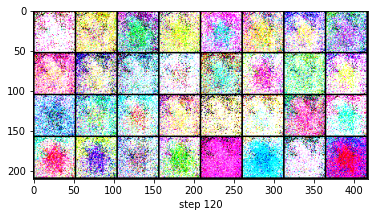


121it [01:03,  1.61it/s]
122it [01:03,  1.75it/s]
123it [01:04,  1.86it/s]
124it [01:04,  1.95it/s]
125it [01:05,  2.04it/s]
126it [01:05,  2.10it/s]
127it [01:06,  2.18it/s]
128it [01:06,  2.09it/s]
129it [01:07,  2.19it/s]
130it [01:07,  2.34it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][130/388] Loss_D: 1.4571; Loss_G: 0.4193


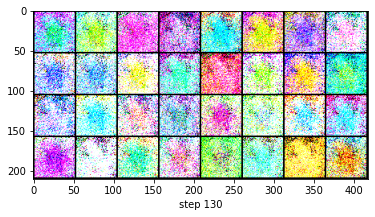


131it [01:08,  1.45it/s]
132it [01:09,  1.62it/s]
133it [01:09,  1.80it/s]
134it [01:10,  1.93it/s]
135it [01:10,  1.98it/s]
136it [01:10,  2.05it/s]
137it [01:11,  2.10it/s]
138it [01:11,  2.16it/s]
139it [01:12,  2.20it/s]
140it [01:12,  2.18it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][140/388] Loss_D: 1.5285; Loss_G: 0.3935


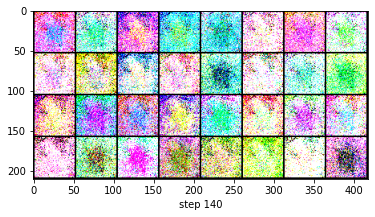


141it [01:13,  1.43it/s]
142it [01:14,  1.62it/s]
143it [01:14,  1.79it/s]
144it [01:15,  1.92it/s]
145it [01:15,  2.00it/s]
146it [01:16,  2.06it/s]
147it [01:16,  2.11it/s]
148it [01:17,  2.15it/s]
149it [01:17,  2.19it/s]
150it [01:17,  2.22it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][150/388] Loss_D: 1.4856; Loss_G: 0.4247


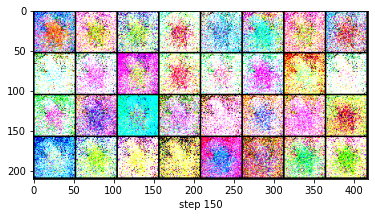


151it [01:19,  1.42it/s]
152it [01:19,  1.62it/s]
153it [01:20,  1.76it/s]
154it [01:20,  1.90it/s]
155it [01:20,  2.00it/s]
156it [01:21,  2.08it/s]
157it [01:21,  2.15it/s]
158it [01:22,  2.16it/s]
159it [01:22,  2.18it/s]
160it [01:23,  2.19it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][160/388] Loss_D: 1.4816; Loss_G: 0.4169


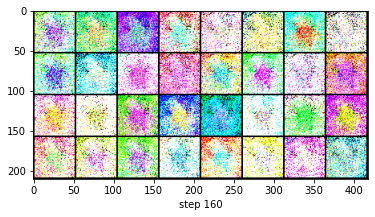


161it [01:24,  1.40it/s]
162it [01:24,  1.60it/s]
163it [01:25,  1.75it/s]
164it [01:25,  1.88it/s]
165it [01:26,  1.98it/s]
166it [01:26,  2.06it/s]
167it [01:27,  2.12it/s]
168it [01:27,  2.14it/s]
169it [01:28,  2.15it/s]
170it [01:28,  2.18it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][170/388] Loss_D: 1.5116; Loss_G: 0.4051


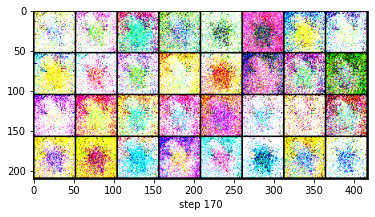


171it [01:29,  1.38it/s]
172it [01:30,  1.54it/s]
173it [01:30,  1.72it/s]
174it [01:31,  1.87it/s]
175it [01:31,  1.96it/s]
176it [01:32,  2.05it/s]
177it [01:32,  2.07it/s]
178it [01:32,  2.12it/s]
179it [01:33,  2.13it/s]
180it [01:33,  2.13it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][180/388] Loss_D: 1.4727; Loss_G: 0.4267


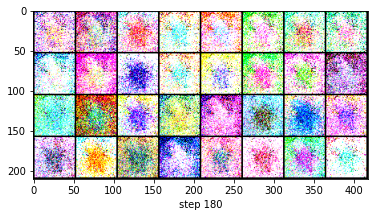


181it [01:35,  1.36it/s]
182it [01:35,  1.54it/s]
183it [01:36,  1.69it/s]
184it [01:36,  1.83it/s]
185it [01:37,  1.94it/s]
186it [01:37,  2.02it/s]
187it [01:37,  2.09it/s]
188it [01:38,  2.11it/s]
189it [01:38,  2.13it/s]
190it [01:39,  2.23it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][190/388] Loss_D: 1.4937; Loss_G: 0.4112


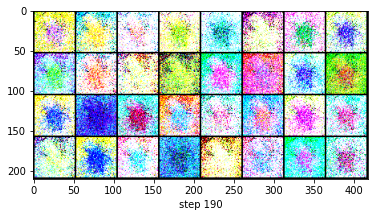


191it [01:40,  1.38it/s]
192it [01:41,  1.57it/s]
193it [01:41,  1.72it/s]
194it [01:41,  1.84it/s]
195it [01:42,  1.92it/s]
196it [01:42,  2.02it/s]
197it [01:43,  2.08it/s]
198it [01:43,  2.16it/s]
199it [01:44,  2.16it/s]
200it [01:44,  2.17it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][200/388] Loss_D: 1.5554; Loss_G: 0.3848


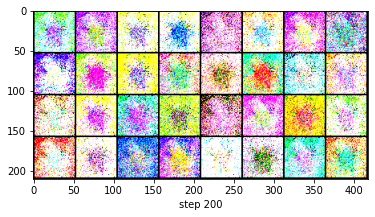


201it [01:45,  1.40it/s]
202it [01:46,  1.60it/s]
203it [01:46,  1.75it/s]
204it [01:47,  1.87it/s]
205it [01:47,  1.96it/s]
206it [01:48,  2.24it/s]
207it [01:48,  2.49it/s]
208it [01:48,  2.38it/s]
209it [01:49,  2.35it/s]
210it [01:49,  2.29it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][210/388] Loss_D: 1.4758; Loss_G: 0.4436


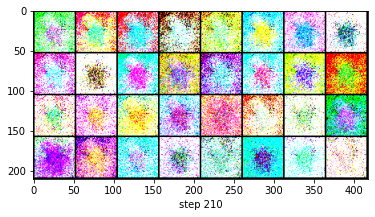


211it [01:51,  1.40it/s]
212it [01:51,  1.60it/s]
213it [01:51,  1.75it/s]
214it [01:52,  1.84it/s]
215it [01:52,  1.91it/s]
216it [01:53,  1.97it/s]
217it [01:53,  2.03it/s]
218it [01:54,  2.08it/s]
219it [01:54,  2.15it/s]
220it [01:55,  2.17it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][220/388] Loss_D: 1.5757; Loss_G: 0.3610


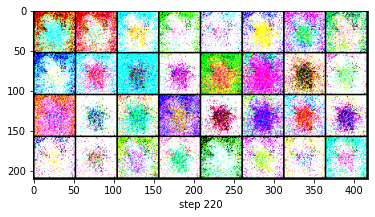


221it [01:56,  1.35it/s]
222it [01:56,  1.50it/s]
223it [01:57,  1.67it/s]
224it [01:57,  1.79it/s]
225it [01:58,  1.88it/s]
226it [01:58,  1.98it/s]
227it [01:59,  2.06it/s]
228it [01:59,  2.11it/s]
229it [02:00,  2.16it/s]
230it [02:00,  2.15it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][230/388] Loss_D: 1.4569; Loss_G: 0.4192


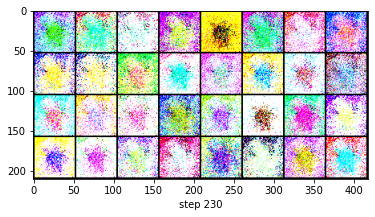


231it [02:01,  1.34it/s]
232it [02:02,  1.54it/s]
233it [02:02,  1.69it/s]
234it [02:03,  1.84it/s]
235it [02:03,  1.95it/s]
236it [02:04,  2.02it/s]
237it [02:04,  2.07it/s]
238it [02:05,  2.05it/s]
239it [02:05,  2.10it/s]
240it [02:06,  2.09it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][240/388] Loss_D: 1.4714; Loss_G: 0.4114


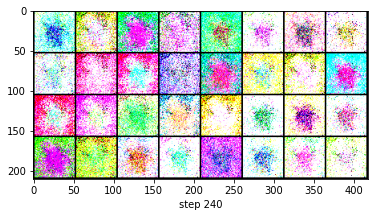


241it [02:07,  1.34it/s]
242it [02:07,  1.54it/s]
243it [02:08,  1.69it/s]
244it [02:08,  1.85it/s]
245it [02:09,  1.90it/s]
246it [02:09,  2.05it/s]
247it [02:10,  2.08it/s]
248it [02:10,  2.13it/s]
249it [02:10,  2.19it/s]
250it [02:11,  2.20it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][250/388] Loss_D: 1.4981; Loss_G: 0.4194


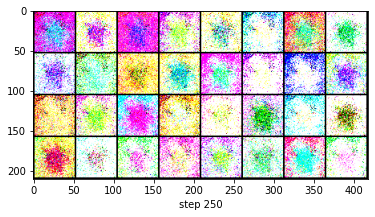


251it [02:12,  1.44it/s]
252it [02:13,  1.62it/s]
253it [02:13,  1.76it/s]
254it [02:14,  1.89it/s]
255it [02:14,  1.98it/s]
256it [02:14,  2.06it/s]
257it [02:15,  2.11it/s]
258it [02:15,  2.14it/s]
259it [02:16,  2.13it/s]
260it [02:16,  2.15it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][260/388] Loss_D: 1.4892; Loss_G: 0.4105


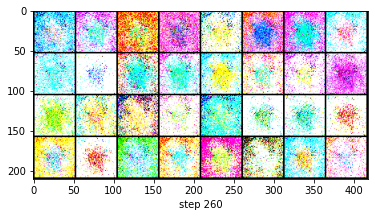


261it [02:18,  1.21it/s]
262it [02:19,  1.31it/s]
263it [02:19,  1.47it/s]
264it [02:19,  1.62it/s]
265it [02:20,  1.73it/s]
266it [02:20,  1.85it/s]
267it [02:21,  1.96it/s]
268it [02:21,  2.02it/s]
269it [02:22,  2.03it/s]
270it [02:22,  2.07it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][270/388] Loss_D: 1.5052; Loss_G: 0.3964


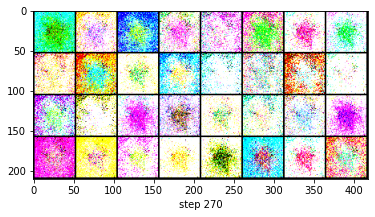


271it [02:24,  1.26it/s]
272it [02:24,  1.37it/s]
273it [02:25,  1.52it/s]
274it [02:25,  1.65it/s]
275it [02:26,  1.73it/s]
276it [02:26,  1.83it/s]
277it [02:27,  1.90it/s]
278it [02:27,  1.93it/s]
279it [02:28,  2.01it/s]
280it [02:28,  2.05it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][280/388] Loss_D: 1.4973; Loss_G: 0.4294


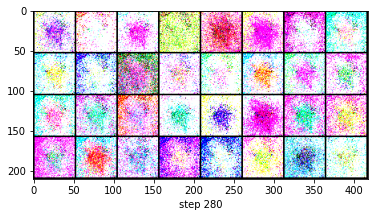


281it [02:30,  1.29it/s]
282it [02:30,  1.46it/s]
283it [02:31,  1.60it/s]
284it [02:31,  1.74it/s]
285it [02:32,  1.81it/s]
286it [02:32,  1.89it/s]
287it [02:33,  1.93it/s]
288it [02:33,  2.01it/s]
289it [02:33,  2.05it/s]
290it [02:34,  2.07it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][290/388] Loss_D: 1.5319; Loss_G: 0.4025


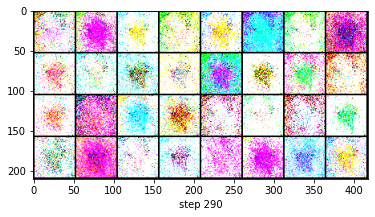


291it [02:36,  1.23it/s]
292it [02:36,  1.28it/s]
293it [02:37,  1.45it/s]
294it [02:37,  1.62it/s]
295it [02:38,  1.76it/s]
296it [02:38,  1.87it/s]
297it [02:39,  1.95it/s]
298it [02:39,  2.01it/s]
299it [02:39,  2.02it/s]
300it [02:40,  2.07it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][300/388] Loss_D: 1.4560; Loss_G: 0.4242


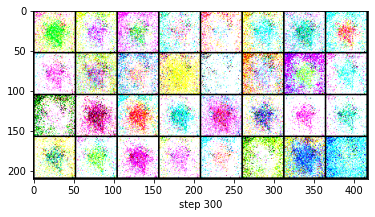


301it [02:41,  1.36it/s]
302it [02:42,  1.51it/s]
303it [02:42,  1.67it/s]
304it [02:43,  1.79it/s]
305it [02:43,  1.91it/s]
306it [02:44,  1.98it/s]
307it [02:44,  2.01it/s]
308it [02:45,  2.05it/s]
309it [02:45,  2.22it/s]
310it [02:45,  2.19it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][310/388] Loss_D: 1.5828; Loss_G: 0.3693


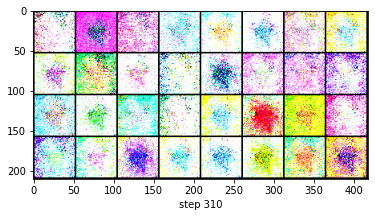


311it [02:47,  1.28it/s]
312it [02:47,  1.43it/s]
313it [02:48,  1.60it/s]
314it [02:48,  1.72it/s]
315it [02:49,  1.86it/s]
316it [02:49,  1.94it/s]
317it [02:50,  2.06it/s]
318it [02:50,  2.16it/s]
319it [02:51,  2.15it/s]
320it [02:51,  2.20it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][320/388] Loss_D: 1.4920; Loss_G: 0.4579


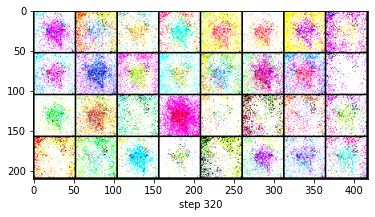


321it [02:52,  1.33it/s]
322it [02:53,  1.51it/s]
323it [02:53,  1.73it/s]
324it [02:54,  1.89it/s]
325it [02:54,  1.99it/s]
326it [02:55,  2.02it/s]
327it [02:55,  2.14it/s]
328it [02:55,  2.17it/s]
329it [02:56,  2.26it/s]
330it [02:56,  2.31it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][330/388] Loss_D: 1.5241; Loss_G: 0.4070


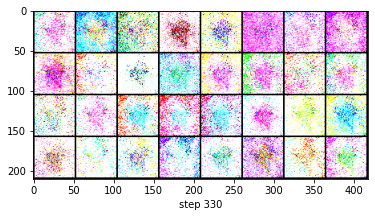


331it [02:58,  1.25it/s]
332it [02:58,  1.41it/s]
333it [02:59,  1.60it/s]
334it [02:59,  1.78it/s]
335it [03:00,  1.88it/s]
336it [03:00,  1.97it/s]
337it [03:01,  2.06it/s]
338it [03:01,  2.13it/s]
339it [03:01,  2.21it/s]
340it [03:02,  2.20it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][340/388] Loss_D: 1.5082; Loss_G: 0.4067


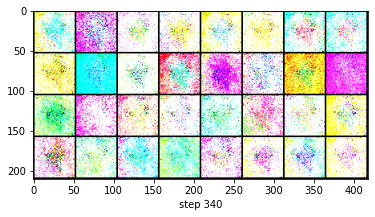


341it [03:03,  1.25it/s]
342it [03:04,  1.51it/s]
343it [03:04,  1.67it/s]
344it [03:05,  1.84it/s]
345it [03:05,  1.97it/s]
346it [03:06,  1.99it/s]
347it [03:06,  2.08it/s]
348it [03:06,  2.16it/s]
349it [03:07,  2.16it/s]
350it [03:07,  2.22it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][350/388] Loss_D: 1.4418; Loss_G: 0.4483


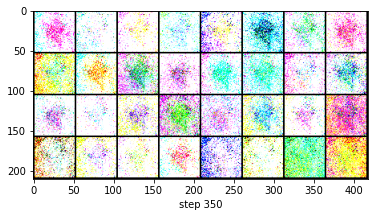


351it [03:09,  1.33it/s]
352it [03:09,  1.49it/s]
353it [03:10,  1.68it/s]
354it [03:10,  1.81it/s]
355it [03:11,  1.98it/s]
356it [03:11,  2.07it/s]
357it [03:11,  2.17it/s]
358it [03:12,  2.25it/s]
359it [03:12,  2.31it/s]
360it [03:13,  2.30it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][360/388] Loss_D: 1.5007; Loss_G: 0.4055


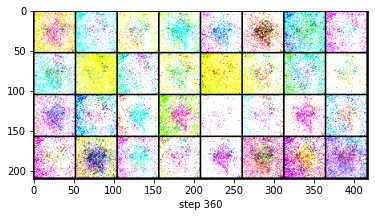


361it [03:14,  1.32it/s]
362it [03:15,  1.49it/s]
363it [03:15,  1.66it/s]
364it [03:16,  1.76it/s]
365it [03:16,  1.89it/s]
366it [03:16,  1.96it/s]
367it [03:17,  2.02it/s]
368it [03:17,  2.06it/s]
369it [03:18,  2.15it/s]
370it [03:18,  2.09it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][370/388] Loss_D: 1.5055; Loss_G: 0.4013


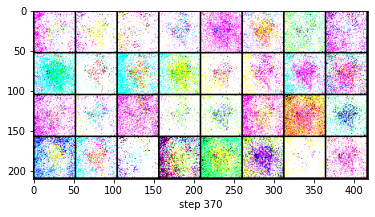


371it [03:20,  1.29it/s]
372it [03:20,  1.46it/s]
373it [03:21,  1.62it/s]
374it [03:21,  1.89it/s]
375it [03:21,  2.14it/s]
376it [03:22,  2.34it/s]
377it [03:22,  2.46it/s]
378it [03:22,  2.38it/s]
379it [03:23,  2.42it/s]
380it [03:23,  2.37it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1/2][380/388] Loss_D: 1.4897; Loss_G: 0.4268


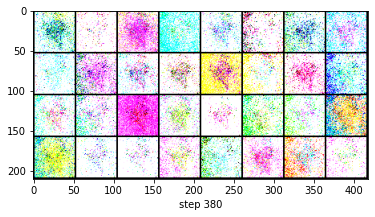


381it [03:25,  1.48it/s]
382it [03:25,  1.66it/s]
383it [03:25,  1.80it/s]
384it [03:26,  1.93it/s]
385it [03:26,  2.02it/s]
386it [03:27,  2.19it/s]
388it [03:27,  1.87it/s]
100%|████████████████████████████████████████████████████| 2/2 [07:05<00:00, 212.53s/it]


In [39]:
batch_size=32
z_dim = 100
gen = generator(z_dim)
disc = Discriminator()
device = 'cuda' if torch.cuda.is_available() else 'cpu'
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(gen))

g_opt = torch.optim.Adam(list(gen.parameters()),lr=3e-4)
d_opt = torch.optim.RMSprop(list(disc.parameters()),lr=3e-4)

criterion = nn.BCELoss()


## earlier the model sizze was somewhere 41 million parameters and disc had 3.9 billion 😂😂
# just because the images were 250*250 and the number of layers were wayyyy more than required

epochs = 2
gen.to(device)
disc.to(device)
Loss_g = []
Loss_d = []

# RUNNING THIS THING GAVE ME AN ERROR SO I CHANGE THE DISCRIMINATOR OR USE TESTING TO CHECK FOR ERRORS

for i in tqdm(range(epochs)):
    for j,(images,_) in tqdm(enumerate(train_loader)):
        try:
            realimage = images.to(device)
            realimage = realimage.view(-1,2500).to(device)
            fake_label = torch.ones(realimage.shape[0])
            disc_out_real = disc(realimage).view(96)
            err_dreal = criterion(disc_out_real,fake_label)
            # Training the discriminator with a fake image generated by the generator
            noise = torch.randn(realimage.shape[0],z_dim)
            fake_img = gen(noise)
            fake_label = torch.zeros(realimage.size()[0])
            disc_out_fake = disc(fake_img.detach()).view(-1)#I think we detach to retain the gradient correct me if i am wrong
            err_dfake = criterion(disc_out_fake,fake_label)
            # now backpropagating error
            errD = err_dreal + err_dfake
            errD.backward()
            d_opt.step()

            ## TRaining Generator
            gen.zero_grad()
            target = torch.ones(realimage.size()[0])
            output = disc(fake_img).view(-1)
            errG = criterion(output, target)
            errG.backward()
            g_opt.step()
            Loss_g.append(errG)
            Loss_d.append(errD)

            # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
            if j % 10 == 0:
                print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (i, epochs, j, len(train_loader), errD.item(), errG.item()))
                size=(3,50,50)
                plt.imshow(make_grid(fake_img.detach().cpu().view(32,*size)).permute(1, 2, 0).squeeze())
                vutils.save_image(realimage, '%s/real_samples.png' % "./results", normalize=True)
                fake = gen(noise)
                plt.xlabel(f'step {j}')
                vutils.save_image(fake_img.data, '%s/fake_samples_epoch_%03d.png' % ("./results", i), normalize=True)
                plt.show()
        except Exception :
            pass
            


In [29]:
torch.save({'gen':gen.state_dict(),
           'gopt':g_opt.state_dict()
           },'GanDog.pth')
torch.save({'disc':disc.state_dict(),
            'dopt':d_opt.state_dict()
           },'DiscDog.pth')

torch.save(criterion.state_dict(),'criterionv2.pth')

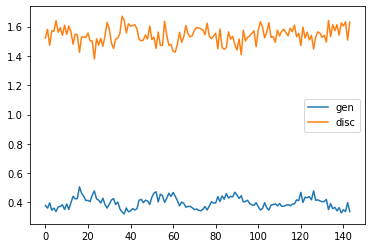

In [36]:
plt.plot(Loss_g,label='gen')
plt.plot(Loss_d,label='disc')
plt.legend()
plt.show()

In [13]:
noise = torch.randn((batch_size,z_dim))

In [14]:
show(make_grid(gen(noise).detach()))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 50, 50])


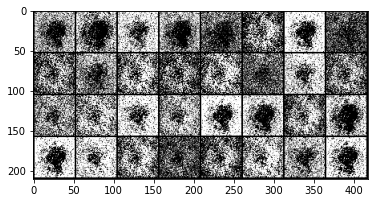

In [16]:
size = (1,50,50)
grid = gen(noise).detach().cpu().view(32,*size)
print(grid.shape)
image_grid = make_grid(grid)
plt.imshow(image_grid.permute(1, 2, 0).squeeze())

# Lets use our Saved Model to train it again 
#  on 20 epochs this  time 

In [35]:
chkpoint = torch.load('GanDog.pth')
gen.load_state_dict(chkpoint['gen'])
gopt = torch.optim.Adam(gen.parameters(),lr=3e-4)
gopt.load_state_dict(chkpoint['gopt'])

chkpointd = torch.load('DiscDog.pth')
disc.load_state_dict(chkpointd['disc'])
dopt = torch.optim.RMSprop(disc.parameters(),lr=3e-5)
dopt.load_state_dict(chkpointd['dopt'])

  0%|                                                            | 0/20 [00:00<?, ?it/s]
0it [00:00, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/20][0/388] Loss_D: 1.5340; Loss_G: 0.3999


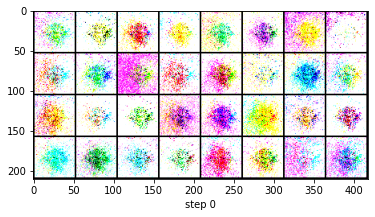


1it [00:01,  1.43s/it]
2it [00:01,  1.21it/s]
3it [00:02,  1.50it/s]
4it [00:02,  1.74it/s]
5it [00:03,  1.89it/s]
6it [00:03,  2.01it/s]
7it [00:04,  2.10it/s]
8it [00:04,  2.14it/s]
9it [00:04,  2.20it/s]
10it [00:05,  2.17it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/20][10/388] Loss_D: 1.5203; Loss_G: 0.4039


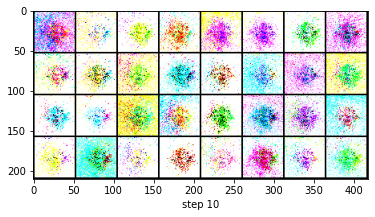


11it [00:06,  1.31it/s]
12it [00:07,  1.48it/s]
13it [00:07,  1.64it/s]
14it [00:08,  1.74it/s]
15it [00:08,  1.84it/s]
16it [00:09,  1.96it/s]
17it [00:09,  2.05it/s]
18it [00:10,  2.13it/s]
19it [00:10,  2.20it/s]
20it [00:10,  2.19it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/20][20/388] Loss_D: 1.5318; Loss_G: 0.4058


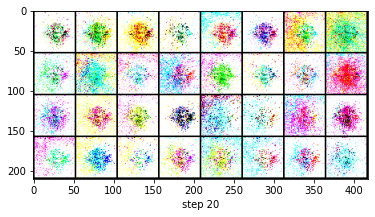


21it [00:12,  1.25it/s]
22it [00:13,  1.43it/s]
23it [00:13,  1.61it/s]
24it [00:13,  1.76it/s]
25it [00:14,  1.89it/s]
26it [00:14,  2.02it/s]
27it [00:15,  2.09it/s]
28it [00:15,  2.16it/s]
29it [00:16,  2.13it/s]
30it [00:16,  2.19it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/20][30/388] Loss_D: 1.5488; Loss_G: 0.3869


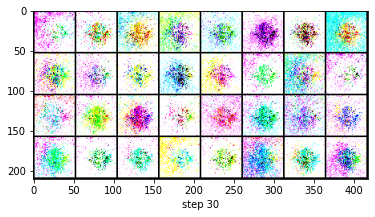


31it [00:18,  1.26it/s]
32it [00:18,  1.44it/s]
33it [00:18,  1.62it/s]
34it [00:19,  1.77it/s]
35it [00:19,  1.92it/s]
36it [00:20,  1.99it/s]
37it [00:20,  2.03it/s]
38it [00:21,  2.11it/s]
39it [00:21,  2.17it/s]
40it [00:22,  2.19it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/20][40/388] Loss_D: 1.5033; Loss_G: 0.4118


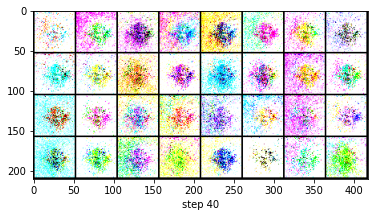


41it [00:23,  1.31it/s]
42it [00:24,  1.50it/s]
43it [00:24,  1.67it/s]
44it [00:24,  1.83it/s]
45it [00:25,  1.90it/s]
46it [00:25,  2.00it/s]
47it [00:26,  1.75it/s]
  0%|                                                            | 0/20 [00:26<?, ?it/s]


KeyboardInterrupt: 

In [38]:
batch_size=32
z_dim = 64

chkcriteria = torch.load('criterionv2.pth')
criterion = nn.BCELoss()

criterion.load_state_dict(chkcriteria)
epochs = 20
gen.to(device)
disc.to(device)
Loss_g = []
Loss_d = []

# RUNNING THIS THING GAVE ME AN ERROR SO I CHANGE THE DISCRIMINATOR OR USE TESTING TO CHECK FOR ERRORS

for i in tqdm(range(epochs)):
    for j,(images,_) in tqdm(enumerate(train_loader)):
        try:
            realimage = images.to(device)
            realimage = realimage.view(-1,2500).to(device)
            fake_label = torch.ones(realimage.shape[0])
            disc_out_real = disc(realimage).view(96)
            err_dreal = criterion(disc_out_real,fake_label)
            # Training the discriminator with a fake image generated by the generator
            noise = torch.randn(realimage.shape[0],z_dim)
            fake_img = gen(noise)
            fake_label = torch.zeros(realimage.size()[0])
            disc_out_fake = disc(fake_img.detach()).view(-1)#I think we detach to retain the gradient correct me if i am wrong
            err_dfake = criterion(disc_out_fake,fake_label)
            # now backpropagating error
            errD = err_dreal + err_dfake
            errD.backward()
            dopt.step()

            ## TRaining Generator
            gen.zero_grad()
            target = torch.ones(realimage.size()[0])
            output = disc(fake_img).view(-1)
            errG = criterion(output, target)
            errG.backward()
            gopt.step()
            Loss_g.append(errG)
            Loss_d.append(errD)

            # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
            if j % 10 == 0:
                print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (i, epochs, j, len(train_loader), errD.item(), errG.item()))
                size=(3,50,50)
                plt.imshow(make_grid(fake_img.detach().cpu().view(32,*size)).permute(1, 2, 0).squeeze())
                vutils.save_image(realimage, '%s/real_samples.png' % "./results", normalize=True)
                fake = gen(noise)
                plt.xlabel(f'step {j}')
                vutils.save_image(fake_img.data, '%s/fake_samples_epoch_%03d.png' % ("./results", i), normalize=True)
                plt.show()
                torch.save({'gen':gen.state_dict(),
                           'gopt':g_opt.state_dict()
                           },'GanDog.pth')
                torch.save({'disc':disc.state_dict(),
                            'dopt':d_opt.state_dict()
                           },'DiscDog.pth')
                torch.save(criterion.state_dict(),'criterionv2.pth')
        
        except Exception as e:
            print(e)
            
